<a href="https://colab.research.google.com/github/JyothiSupriya/Multi-Model-NLP-Framework-for-Unstructured-Text-Analysis/blob/main/Top2Vec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Video: 1


In [ ]:
!pip install top2vec[sentence_encoders]

In [ ]:
!pip install tensorflow tensorflow_hub tensorflow_text

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_excel('/content/Data.xlsx')

# Show the content of the DataFrame
#print(df)

docs = df['NARRATIVE'].tolist()
cause=df['CAUSE']

In [ ]:
docs[0]

'ON JANUARY 29 2024, AROUND 4:40PM G3 UNDERGROUND (SUB OF ONYX CONSULTING WORKING FOR SPARKLIGHT), WAS PULLING BACK FIBER CONDUIT WITH A DIRECTIONAL DRILLING RIG AND DAMAGED 2" POLY MAIN WITH A MAKESHIFT ATTACHMENT THAT EXPANDS THE BORE HOLE THEY ORIGINALLY BORED. THE MAIN THAT WAS DAMAGED, WAS NOT POTHOLED PRIOR TO CONTRACTOR BORING. THE MAIN WAS PROPERLY AND CORRECTLY MARKED AND FLAGGED BY USIC.    ESCAPING GAS FROM THE DAMAGED 2" POLY MAIN MIGRATED TO 502 AVE D RESULTING IN IGNITION OF GAS.'

In [ ]:
!pip install top2vec

In [ ]:
from top2vec import Top2Vec

In [ ]:
docs = df.NARRATIVE.tolist()
docs = [str(element) for element in docs]

In [ ]:
model = Top2Vec(docs)

2024-09-13 05:33:35,491 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-09-13 05:33:36,395 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2024-09-13 05:33:39,235 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-09-13 05:35:23,915 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-09-13 05:35:33,493 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-09-13 05:35:33,551 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [ ]:
topic_sizes, topic_nums = model.get_topic_sizes()
print(topic_sizes)

[456 288 219  95  90  75  74  61  47  39]


In [ ]:
print(topic_nums)

[0 1 2 3 4 5 6 7 8 9]


In [ ]:
topic_words, word_scores, topic_nums = model.get_topics(10)

In [ ]:
for words, scores, num in zip (topic_words, word_scores, topic_nums):
  print(num)
  print(f"Words: {words}")

0
Words: ['gas' 'pipeline' 'fuel' 'utilities' 'ignition' 'incident' 'evacuated'
 'occurred' 'facilities' 'repaired' 'emergency' 'services' 'several'
 'call' 'facility' 'socalgas' 'electrical' 'homeowner' 'occupants'
 'response' 'notified' 'inspection' 'repair' 'energy' 'southwest' 'were'
 'responded' 'residential' 'area' 'homes' 'caused' 'service' 'reporting'
 'reports' 'regulator' 'outage' 'investigation' 'county' 'department'
 'associated' 'responders' 'related' 'other' 'operations' 'company'
 'affected' 'began' 'property' 'public' 'repairs']
1
Words: ['several' 'gas' 'two' 'three' 'four' 'incident' 'other' 'pipeline'
 'first' 'utilities' 'caused' 'secondary' 'occurred' 'fuel' 'repaired'
 'number' 'homeowner' 'ignition' 'services' 'one' 'homes' 'repair'
 'indicated' 'electrical' 'inspection' 'buildings' 'another' 'evacuated'
 'responders' 'conditions' 'primary' 'multiple' 'second' 'part' 'section'
 'related' 'resulted' 'residential' 'accident' 'third' 'damages' 'total'
 'event' 'cond

In [ ]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=0,num_docs = 10)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
  print(f"Document: {doc_id}, Score: {score}")
  print("____________")
  print(doc)
  print("----------")
  print()


Document: 1330, Score: 0.9053211212158203
____________
WASHINGTON GAS WAS TOLD BY THE FIRE DEPARTMENT THAT THE METER VALVE WAS TURNED OFF BY THEM AT APPROXIMATELY 22:00. UPON GAINING ACCESS TO THE METER ON DECEMBER 20TH, WASHINGTON GAS CONDUCTED A PRESSURE TEST ON THE SERVICE LINE FROM THE METER VALVE TO THE CAPPED OFF LOCATION AT THE MAIN. THE SERVICE WAS TESTED AT THE OPERATING PRESSURE FOR 15 MINUTES. THE SERVICE LINE HELD THE PRESSURE TEST. AN ODORANT SAMPLE WAS TAKEN AND THE LEVEL OF ODORANT WAS DETERMINED TO BE ACCEPTABLE.    WASHINGTON GAS HAS CONDUCTED ALL THE NECESSARY TESTS AND ACTIVITIES ON THE SYSTEM. ALTHOUGH POST INCIDENT INVESTIGATION FOUND CORROSION AT THE CONNECTION AT THE SERVICE TEE, ON THE STEEL MAIN, NEITHER WASHINGTON GAS NOR THE FIRE DEPARTMENT INVESTIGATION ESTABLISHED MIGRATION OF GAS FROM THE WASHINGTON GAS FACILITY TO THE STRUCTURE PRIOR TO THE INCIDENT. ADDITIONALLY, AN OPEN-ENDED SECTION OF THE CUSTOMER FUEL LINE TERMINATING ON THE SECOND FLOOR WAS FOUND. A

In [ ]:
documents, document_scores, document_ids = model.search_documents_by_keywords(keywords=["Emergency", "Excavation"], num_docs=5)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 1439, Score: 0.444953880931919
-----------
nan
-----------

Document: 1409, Score: 0.4449538411216589
-----------
nan
-----------

Document: 1065, Score: 0.4449538411216589
-----------
nan
-----------

Document: 744, Score: 0.4449538411216589
-----------
nan
-----------

Document: 1307, Score: 0.4449538411216589
-----------
nan
-----------



# Video:2

In [ ]:
!pip install umap-learn

In [ ]:
!pip install hdbscan

In [ ]:
!pip install top2vec

In [ ]:
from top2vec import Top2Vec

# Example document corpus
'''docs = [
    "Document about topic A.",
    "Another document related to topic B.",
    "This one is about topic C.",
    "Yet another document about topic A.",
    "Document discussing topic B in detail."
]'''

# Step 1: Initialize the Top2Vec model
# It automatically handles embedding creation, dimensionality reduction (UMAP), and clustering (HDBSCAN)
model = Top2Vec(docs, speed="deep-learn", workers=4)

# Step 2: Get the number of identified topics
num_topics = model.get_num_topics()
print(f"Number of topics identified: {num_topics}")

# Step 3: Get topics and their related words
topic_words, word_scores, topic_nums = model.get_topics(num_topics=num_topics)

# Display topics
for i, (words, scores) in enumerate(zip(topic_words, word_scores)):
    print(f"Topic {i+1}:")
    print(f"Words: {words}")
    print(f"Word Scores: {scores}\n")

# Step 4: Visualize topics using UMAP
#model.visualize_topics()

# Optional: Visualize the documents belonging to a specific topic
#topic_num = 0  # For the first topic (you can change this)
#model.visualize_documents(topic_num=topic_num)


2024-09-13 05:06:30,897 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-09-13 05:06:33,615 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2024-09-13 05:06:40,487 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-09-13 05:08:14,438 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-09-13 05:08:23,166 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-09-13 05:08:23,226 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


Number of topics identified: 8
Topic 1:
Words: ['gas' 'pipeline' 'fuel' 'utilities' 'ignition' 'evacuated' 'occurred'
 'incident' 'facilities' 'energy' 'repaired' 'electrical' 'call'
 'emergency' 'socalgas' 'several' 'services' 'response' 'homeowner'
 'southwest' 'regulator' 'responded' 'occupants' 'were' 'facility'
 'inspection' 'notified' 'repair' 'homes' 'caused' 'outage' 'reports'
 'area' 'responders' 'reporting' 'associated' 'residential'
 'investigation' 'began' 'related' 'county' 'service' 'affected' 'valves'
 'company' 'other' 'showed' 'operations' 'called' 'repairs']
Word Scores: [0.17569605 0.13660881 0.12784092 0.12127763 0.11656417 0.11052014
 0.10758165 0.10657658 0.10051005 0.09634164 0.09614142 0.09489855
 0.09456713 0.09377949 0.09248611 0.09234114 0.09046187 0.08971524
 0.08820403 0.08816797 0.0870526  0.08627773 0.08604952 0.08599068
 0.08460775 0.08419812 0.08298044 0.08265506 0.08139384 0.08112751
 0.08094919 0.07934661 0.07919937 0.07774913 0.07749344 0.07737994
 0

In [ ]:
model.get_num_topics()

8

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Emergency"], num_topics=5)

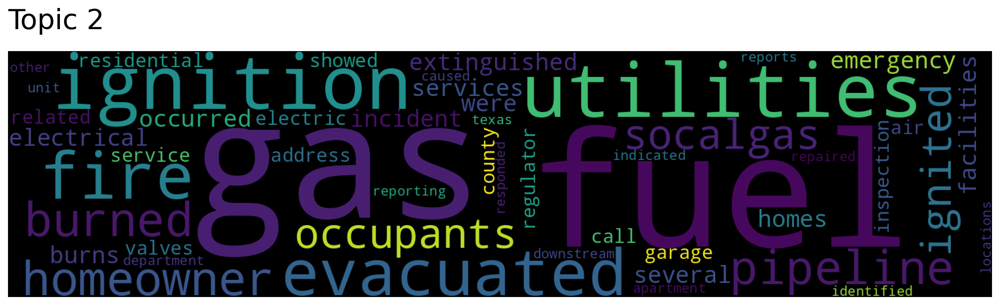

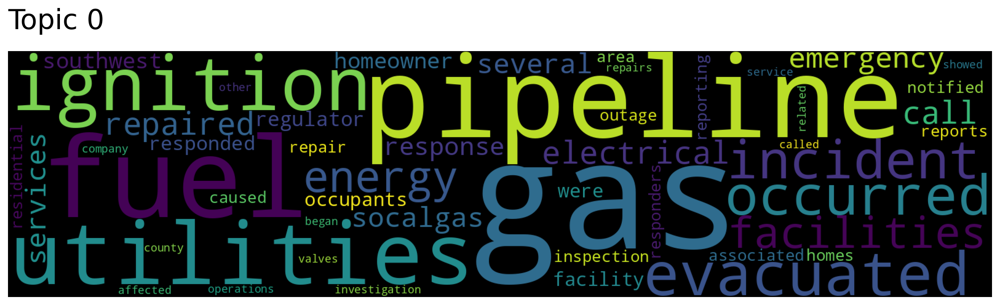

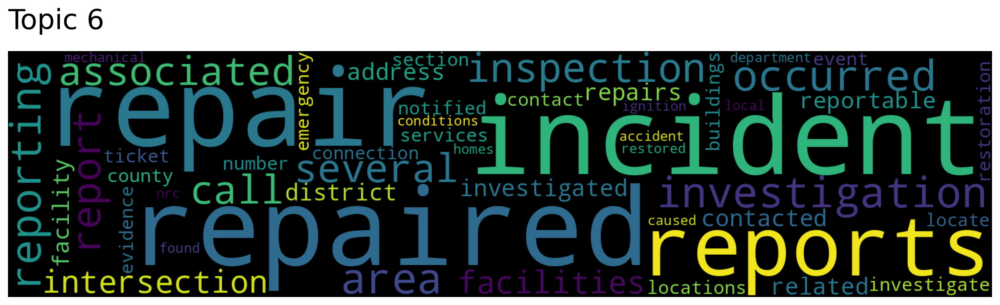

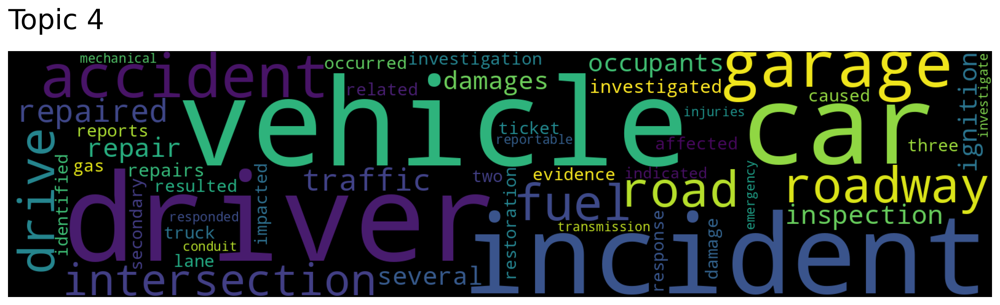

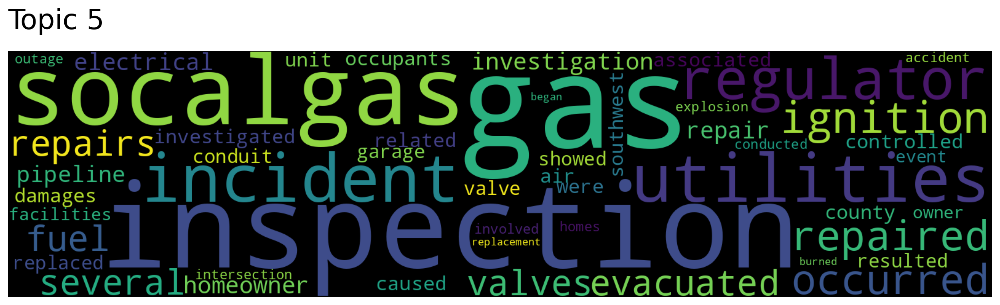

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Emergency"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

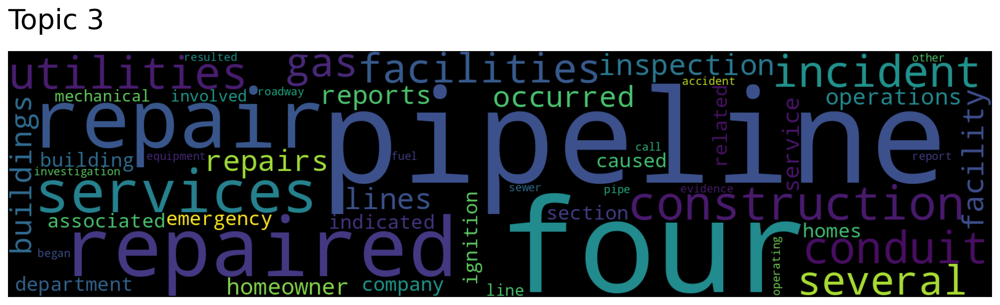

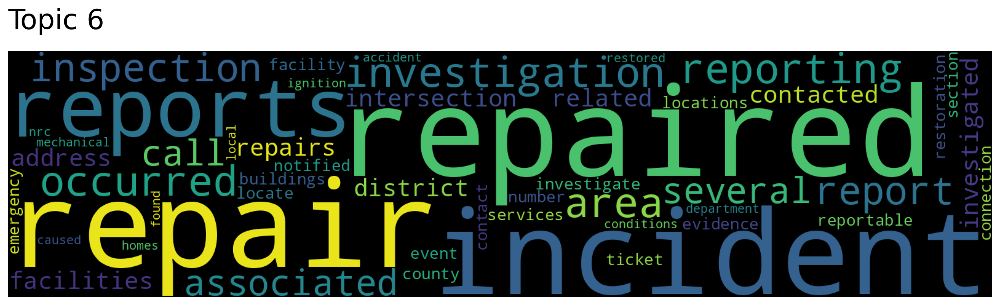

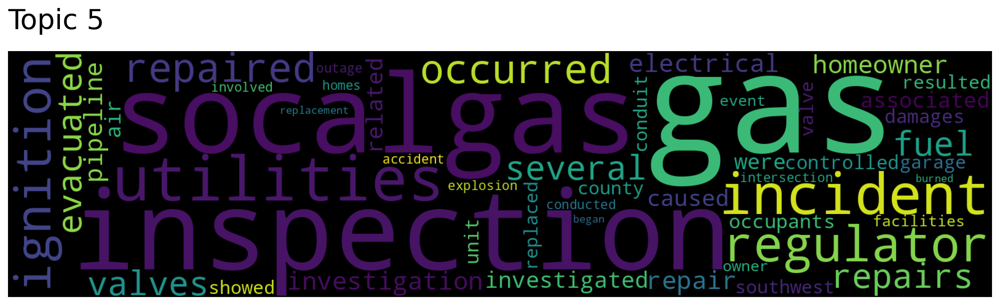

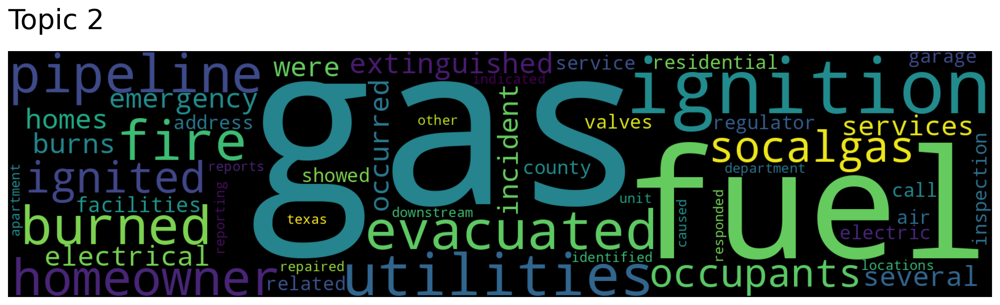

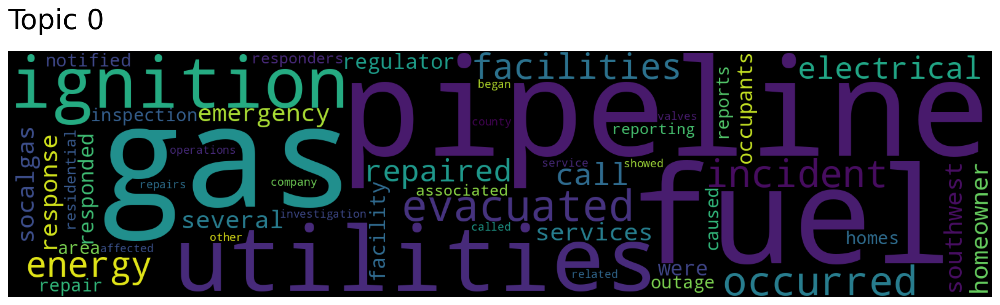

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Excavation"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

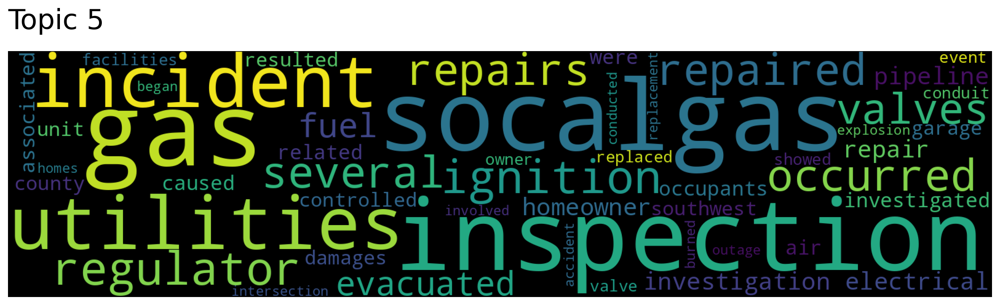

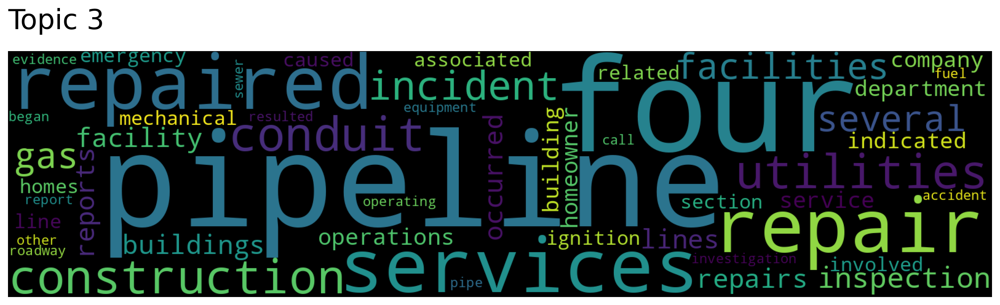

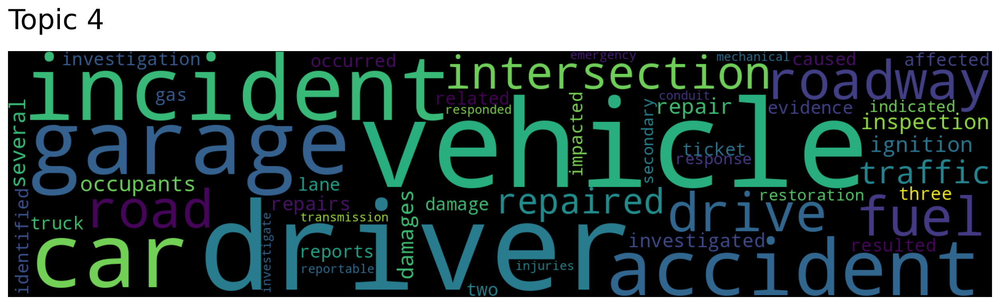

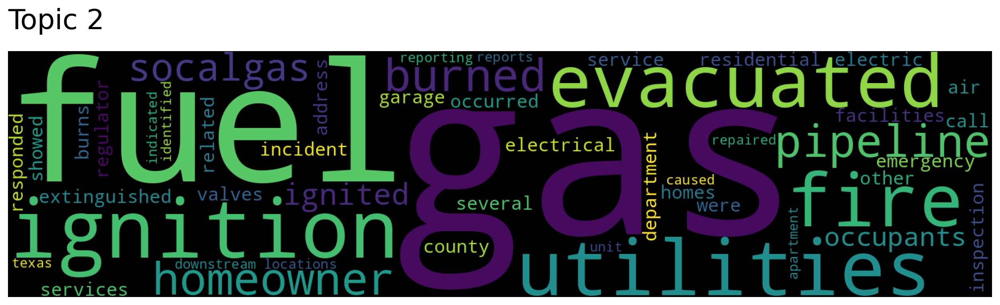

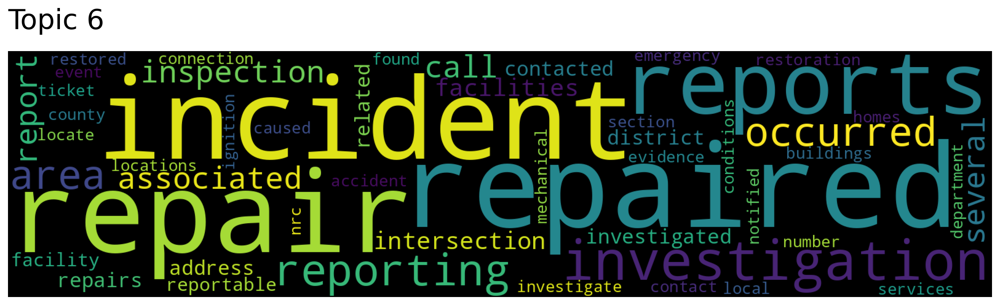

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Safety"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

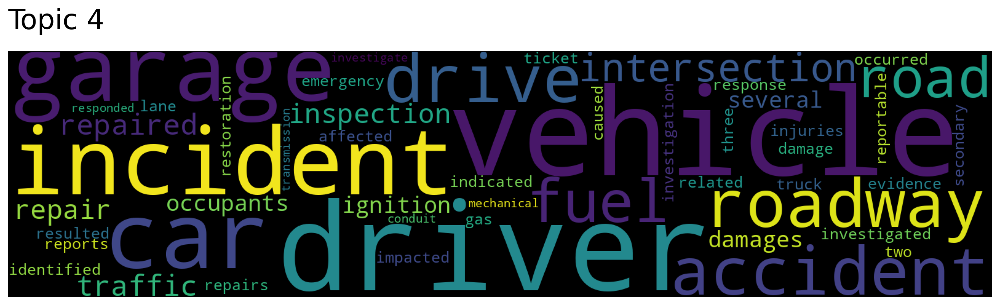

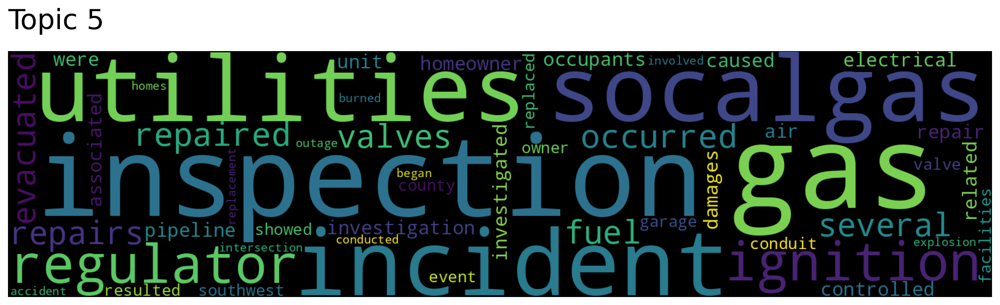

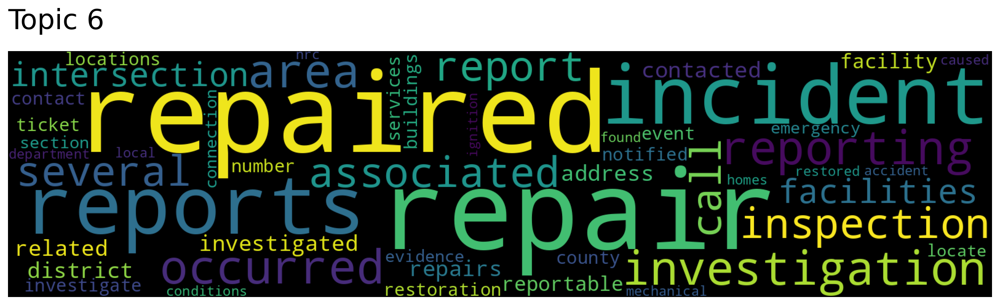

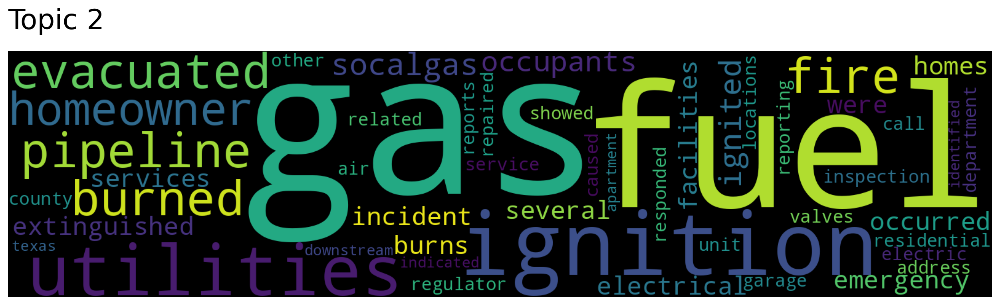

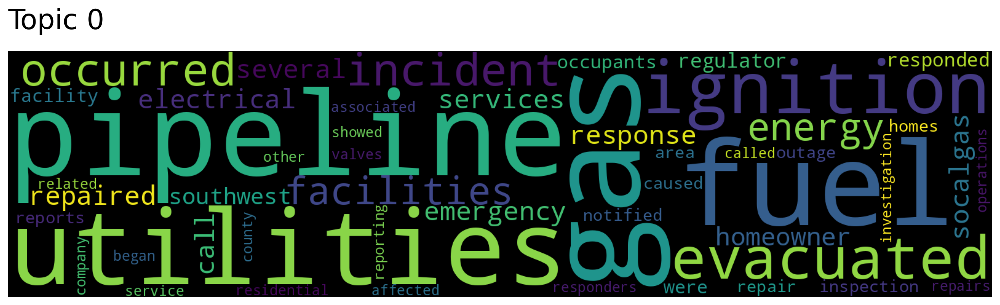

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Incident"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

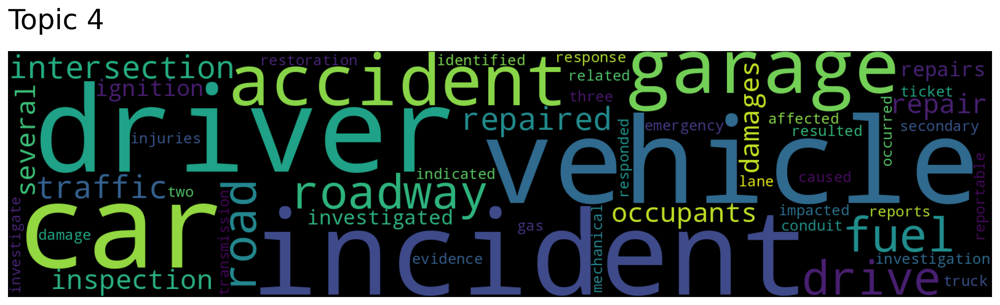

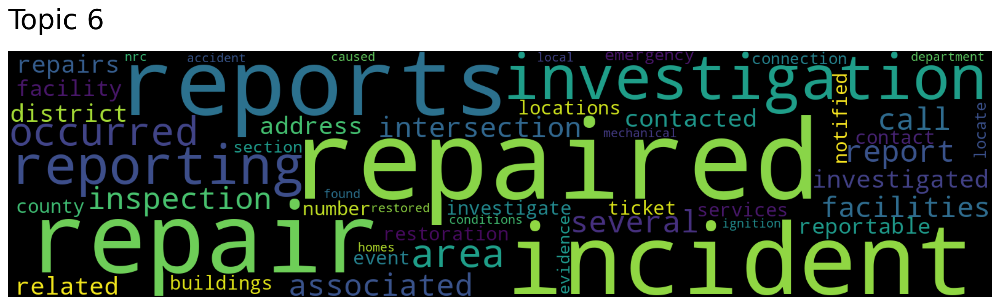

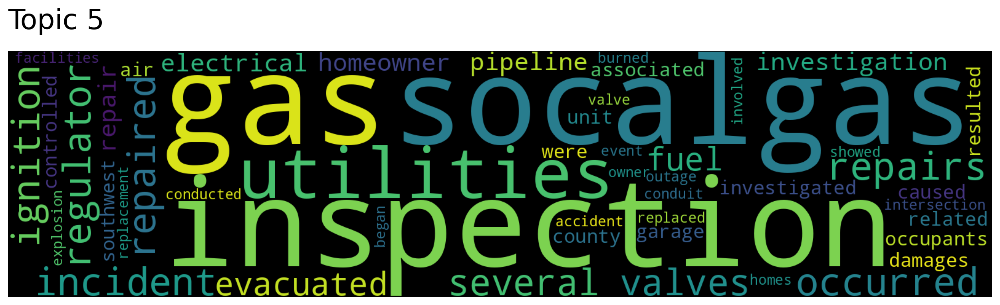

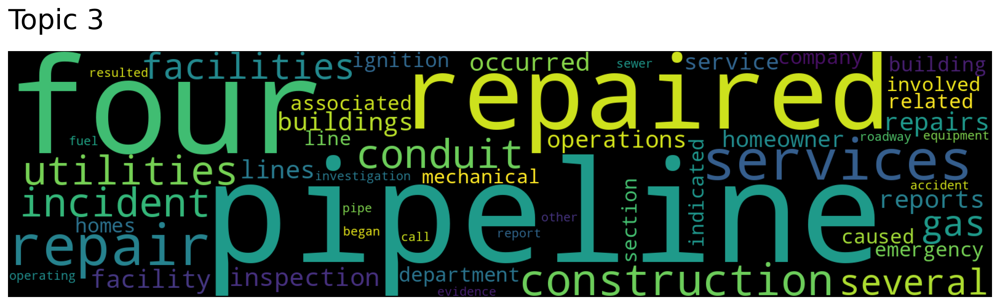

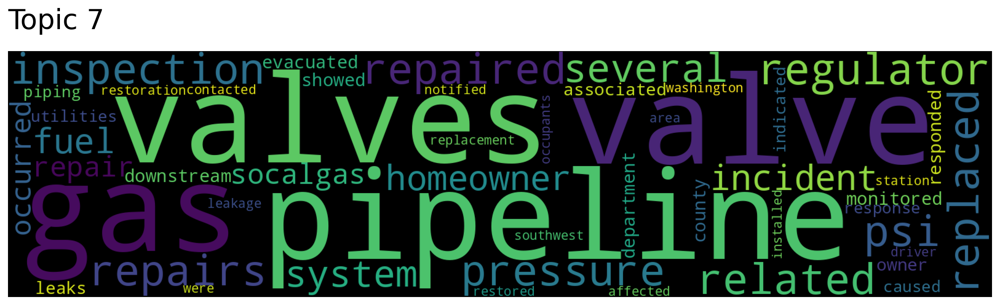

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Injuries"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

In [ ]:
words, word_scores = model.similar_words(keywords=["Emergency"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

evacuated 0.6330427801910736
situation 0.6325277359228352
relief 0.6233438938501874
accident 0.5996526807966034
extinguished 0.5829481450376783
hospitalization 0.5775673962019364
safety 0.5658784886944074
incident 0.5618652567810889
hospital 0.5569639346832657
outage 0.5397481003048976
temporary 0.5339471457532129
facility 0.5325984764104756
injuries 0.5242149741148574
dept 0.5241447239799437
struck 0.5193592813410226
escaping 0.5166064041859042
failure 0.5142780584760249
onsite 0.5130824275465662
fatalities 0.5121937466756723
leakage 0.5068449238994346


In [ ]:
words, word_scores = model.similar_words(keywords=["Excavation"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

excavating 0.9052815234637954
excavated 0.8770863412765557
excavator 0.8128066490931347
dig 0.7667895171952512
digging 0.7643144677411555
drilling 0.7058751713147514
hole 0.6856225707457246
underground 0.6599278706803962
sewer 0.6532164259521966
bore 0.6276149082065439
soil 0.6274933260180121
ground 0.62519193112306
destroyed 0.6138462403390076
inlet 0.613667173147926
extinguished 0.6095518396826437
roadway 0.6058176639454267
basement 0.6037167929696889
piping 0.6002904055336707
bypass 0.597206895290451
cracked 0.5890830630891352


In [ ]:
words, word_scores = model.similar_words(keywords=["Safety"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

safe 0.8165156801700516
secured 0.7447622941008152
ensure 0.5841007615754055
emergency 0.565878451833945
vehicle 0.539912988233326
bypass 0.5369943242579389
fitting 0.5313226280269037
facility 0.5201148053864986
accident 0.5194480793998444
onsite 0.5192324511736337
fatalities 0.5108542705194676
injuries 0.5068978291716213
evacuated 0.5041787700281736
residential 0.4989995004585277
inlet 0.49366655541379945
dot 0.4934160409724345
worker 0.48938945893583596
lane 0.4862699825165651
damages 0.48521446736445417
dept 0.4846493584416596


In [ ]:
words, word_scores = model.similar_words(keywords=["Incident"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

accident 0.798015490430326
occurred 0.7480148066770558
caused 0.6952169976645144
event 0.6858042819293381
struck 0.6801549213230167
damages 0.6781514298876719
involved 0.6575182136673599
injuries 0.6548156371771223
causing 0.6527005422969134
injury 0.6492409966407033
affected 0.6428797802247099
damaged 0.6381238100612536
damage 0.632720546950948
destroyed 0.6287212985095132
situation 0.6274194132568062
impacted 0.6237168283451695
failure 0.6225804692677268
resulted 0.6182678948719859
injured 0.6170804800800018
dept 0.6127123592807049


In [ ]:
words, word_scores = model.similar_words(keywords=["Injuries"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

injury 0.9497046480704447
injured 0.9024223993689979
damages 0.7292461721441514
damage 0.7200711326806406
damaged 0.7166763098860458
accident 0.7035470625939277
broken 0.6565279042836359
incident 0.6548156835658862
fatalities 0.6438863541532547
affected 0.6428027448684701
struck 0.6420344166733274
caused 0.6391500465651401
loss 0.6306974520292792
causing 0.6106872137727277
destroyed 0.6037977652248765
hit 0.5999545183787176
cracked 0.581606058636675
impact 0.5813715088525491
impacted 0.5798218946540479
relief 0.5789402599278259


In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["Injuries"], num_topics=5)

# Display the topics
for i, topic_num in enumerate(topic_nums):
    print(f"Topic {topic_num} - Similarity Score: {topic_scores[i]}")
    print(f"Topic Words: {topic_words[i]}")
   # print(f"Word Scores: {word_scores[i]}\n")

Topic 5 - Similarity Score: 0.07613682396060886
Topic Words: ['vehicle' 'driver' 'incident' 'garage' 'car' 'accident' 'roadway' 'drive'
 'road' 'fuel' 'intersection' 'repaired' 'traffic' 'inspection' 'repair'
 'damages' 'several' 'occupants' 'investigated' 'ignition' 'repairs'
 'investigation' 'two' 'occurred' 'caused' 'evidence' 'identified'
 'resulted' 'affected' 'related' 'reports' 'damage' 'lane' 'ticket'
 'impacted' 'truck' 'three' 'secondary' 'restoration' 'indicated'
 'response' 'reportable' 'investigate' 'injuries' 'gas' 'transmission'
 'emergency' 'mechanical' 'conduit' 'responded']
Topic 9 - Similarity Score: 0.04281352100516049
Topic Words: ['gas' 'fuel' 'ignition' 'explosion' 'fire' 'incident' 'caused' 'several'
 'damages' 'accident' 'garage' 'two' 'first' 'burned' 'damage' 'ignited'
 'cause' 'extinguished' 'and' 'three' 'safety' 'other' 'roadway'
 'occurred' 'car' 'four' 'causing' 'driver' 'burns' 'road' 'electrical'
 'emergency' 'failure' 'resulted' 'vehicle' 'indicated' 

In [ ]:
num_docs_to_retrieve = 5  # Number of documents you want to retrieve per topic
for topic_num in range(num_topics):
    print(f"\nDocuments for Topic {topic_num+1}:")

    # Retrieve the top `num_docs_to_retrieve` most relevant documents for each topic
    doc_texts, doc_scores, doc_ids = model.search_documents_by_topic(topic_num=topic_num, num_docs=num_docs_to_retrieve)

    # Display the retrieved documents and their similarity scores
    for i, (doc_text, doc_id) in enumerate(zip(doc_texts, doc_ids)):
        print(f"Document ID: {doc_id}")
        print(f"Similarity Score: {doc_scores[i]}")
        print(f"Document Text: {doc_text}\n")


Documents for Topic 1:
Document ID: 1330
Similarity Score: 0.8962329626083374
Document Text: WASHINGTON GAS WAS TOLD BY THE FIRE DEPARTMENT THAT THE METER VALVE WAS TURNED OFF BY THEM AT APPROXIMATELY 22:00. UPON GAINING ACCESS TO THE METER ON DECEMBER 20TH, WASHINGTON GAS CONDUCTED A PRESSURE TEST ON THE SERVICE LINE FROM THE METER VALVE TO THE CAPPED OFF LOCATION AT THE MAIN. THE SERVICE WAS TESTED AT THE OPERATING PRESSURE FOR 15 MINUTES. THE SERVICE LINE HELD THE PRESSURE TEST. AN ODORANT SAMPLE WAS TAKEN AND THE LEVEL OF ODORANT WAS DETERMINED TO BE ACCEPTABLE.    WASHINGTON GAS HAS CONDUCTED ALL THE NECESSARY TESTS AND ACTIVITIES ON THE SYSTEM. ALTHOUGH POST INCIDENT INVESTIGATION FOUND CORROSION AT THE CONNECTION AT THE SERVICE TEE, ON THE STEEL MAIN, NEITHER WASHINGTON GAS NOR THE FIRE DEPARTMENT INVESTIGATION ESTABLISHED MIGRATION OF GAS FROM THE WASHINGTON GAS FACILITY TO THE STRUCTURE PRIOR TO THE INCIDENT. ADDITIONALLY, AN OPEN-ENDED SECTION OF THE CUSTOMER FUEL LINE TERMI

In [ ]:
import pandas as pd
from top2vec import Top2Vec

# Load your documents (assuming they are stored in a dataframe)
df = pd.DataFrame(docs, columns=["text_column"])  # Replace with your actual document loading

# Remove missing values
df = df.dropna(subset=['text_column'])

# Remove empty or whitespace-only documents
df = df[df['text_column'].str.strip() != '']

# Remove documents with fewer than 3 words
df = df[df['text_column'].str.split().str.len() > 2]

# Ensure all text is in UTF-8 format
df['text_column'] = df['text_column'].apply(lambda x: x.encode('utf-8', 'ignore').decode('utf-8'))

# Convert the cleaned column to a list of documents
clean_docs = df['text_column'].tolist()

# Step 1: Create the Top2Vec model using cleaned documents
model = Top2Vec(documents=clean_docs, speed="deep-learn", workers=4)

# Step 2: Search for documents related to the keyword "Emergency"
document_words, document_scores, document_ids = model.search_documents_by_keywords(keywords=["emergency"], num_docs=5)

# Step 3: Display the results
for i, doc_id in enumerate(document_ids):
    print(f"Document ID: {doc_id}")
    print(f"Similarity Score: {document_scores[i]}")
    print(f"Document Text: {clean_docs[doc_id]}\n")


<ipython-input-59-252d93ec67e4>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['text_column'] = df['text_column'].apply(lambda x: x.encode('utf-8', 'ignore').decode('utf-8'))
2024-09-13 05:43:23,240 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-09-13 05:43:26,031 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2024-09-13 05:43:30,782 - top2vec - INFO - Creating joint document/word embedding
I

Document ID: 1313
Similarity Score: 0.1789184544961419
Document Text: AROUND 11:18 ON 1/7/11 IT WAS REPORTED THAT A PRIVATE VEHICLE HIT A   GAS METER, RESULTING IN A FIRE.  FROM WHAT I HAVE BEEN TOLD, THE   PRIVATE VEHICLE WAS UNABLE TO STOP DUE TO ICY CONDITIONS, AND RAN   OVER A FENCE AND HIT CORNER OF A HOUSE AND THE GAS METER SET.  THIS   FORCE BROKE THE PIPING AFTER LOCKWING VALVE, AND THEN THE LEAKING   GAS IGNITED.  GAS WAS SHUTOFF AT THE LOCKWING TO MAKE SAFE, THEN   REPAIRS WERE MADE.   NO ONE WAS TAKEN TO HOSPITAL FOR INJURIES, AND   DAMAGE TO THE BRICK HOUSE WAS RELATIVELY MINOR BASED ON PHOTOS.    THE COST ESTIMATE IS LESS THAN $50K, BUT WERE ADVISED TO REPORT IN   CASE THE ACTUAL COST EXCEEDS $50K     ELESMERE FIRE COMPANY REPORT ESTIAMTES NO DMAMGE DUE TO FIRE.  THUS THIS WAS NOT AN INCIDENT AS PER THE NEW DEFINITION, BUT BELIEVED A REPORT HAD TO BE SUBMITED SINCE THE NRC WAS NOTIFIED.    I WOULD LIKE TO RECEIND THE NRC REPPORT AND THIS INCIDENT REPORT.

Document ID: 385


In [ ]:
# Step 2: Search for documents related to the keyword "Emergency"
document_words, document_scores, document_ids = model.search_documents_by_keywords(keywords=["Emergency"], num_docs=5)

# Step 3: Display the results
for i, doc_id in enumerate(document_ids):
    print(f"Document ID: {doc_id}")
    print(f"Similarity Score: {document_scores[i]}")
    print(f"Document Text: {clean_docs[doc_id]}\n")

Document ID: 1313
Similarity Score: 0.1789184544961419
Document Text: AROUND 11:18 ON 1/7/11 IT WAS REPORTED THAT A PRIVATE VEHICLE HIT A   GAS METER, RESULTING IN A FIRE.  FROM WHAT I HAVE BEEN TOLD, THE   PRIVATE VEHICLE WAS UNABLE TO STOP DUE TO ICY CONDITIONS, AND RAN   OVER A FENCE AND HIT CORNER OF A HOUSE AND THE GAS METER SET.  THIS   FORCE BROKE THE PIPING AFTER LOCKWING VALVE, AND THEN THE LEAKING   GAS IGNITED.  GAS WAS SHUTOFF AT THE LOCKWING TO MAKE SAFE, THEN   REPAIRS WERE MADE.   NO ONE WAS TAKEN TO HOSPITAL FOR INJURIES, AND   DAMAGE TO THE BRICK HOUSE WAS RELATIVELY MINOR BASED ON PHOTOS.    THE COST ESTIMATE IS LESS THAN $50K, BUT WERE ADVISED TO REPORT IN   CASE THE ACTUAL COST EXCEEDS $50K     ELESMERE FIRE COMPANY REPORT ESTIAMTES NO DMAMGE DUE TO FIRE.  THUS THIS WAS NOT AN INCIDENT AS PER THE NEW DEFINITION, BUT BELIEVED A REPORT HAD TO BE SUBMITED SINCE THE NRC WAS NOTIFIED.    I WOULD LIKE TO RECEIND THE NRC REPPORT AND THIS INCIDENT REPORT.

Document ID: 385


In [ ]:
# Step 2: View the number of topics found initially
initial_topics = model.get_num_topics()
print(f"Initial number of topics: {initial_topics}")

# Step 3: Perform hierarchical topic reduction
# Define the desired number of topics
desired_topics = 5  # Adjust this number based on your needs

model.hierarchical_topic_reduction(desired_topics)

# Step 4: View the number of topics after reduction
reduced_topics = model.get_num_topics()
print(f"Number of topics after reduction: {reduced_topics}")

# Step 5: Retrieve the reduced topics
topic_words, word_scores, topic_nums = model.get_topics()
for topic in range(len(topic_words)):
    print(f"\nTopic {topic_nums[topic]}:")
    for word, score in zip(topic_words[topic], word_scores[topic]):
        print(f"  {word} ({score:.4f})")

# Optional: Explore documents within a topic
topic_number = topic_nums[0]  # Example: first topic
docs, doc_scores, doc_ids = model.search_documents_by_topic(topic_num=topic_number, num_docs=5)
print(f"\nTop documents in Topic {topic_number}:")
for doc, score in zip(docs, doc_scores):
    print(f"  Score: {score:.4f}, Document: {doc}")

Initial number of topics: 11
Number of topics after reduction: 11

Topic 0:
  gas (0.1807)
  pipeline (0.1494)
  fuel (0.1399)
  utilities (0.1261)
  ignition (0.1143)
  evacuated (0.1086)
  energy (0.1054)
  call (0.1022)
  occurred (0.1015)
  electrical (0.1008)
  facilities (0.0998)
  socalgas (0.0996)
  regulator (0.0984)
  response (0.0975)
  incident (0.0931)
  responded (0.0930)
  repaired (0.0922)
  homeowner (0.0921)
  southwest (0.0899)
  valves (0.0854)
  were (0.0836)
  several (0.0834)
  reports (0.0826)
  responders (0.0825)
  homes (0.0824)
  associated (0.0817)
  notified (0.0813)
  downstream (0.0812)
  related (0.0809)
  emergency (0.0803)
  outage (0.0800)
  inspection (0.0800)
  repair (0.0796)
  occupants (0.0791)
  reporting (0.0783)
  mechanical (0.0780)
  facility (0.0773)
  services (0.0773)
  called (0.0766)
  county (0.0766)
  lines (0.0762)
  contacted (0.0755)
  station (0.0753)
  caused (0.0753)
  conduit (0.0748)
  repairs (0.0746)
  area (0.0745)
  prope